<a href="https://colab.research.google.com/github/dmaresza/tensorflow_course/blob/main/07_TensorFlow_Milestone_Project_1_FoodVision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Milestone Project 1: FoodVision Big

Build a feature extraction model using all of the data from the Food101 dataset.

The goal is to beat the [DeepFood](https://www.researchgate.net/publication/304163308_DeepFood_Deep_Learning-Based_Food_Image_Recognition_for_Computer-Aided_Dietary_Assessment) paper, which used a Convolutional Neural Network and achieved 77.4% top-1 accuracy in 2016.

Much of the work was done in the [lesson notebook](https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/video_notebooks/07_milestone_project_1_food_vision_video.ipynb), and is continued in this notebook.

## 1. TODO
* Use TensorFlow Datasets to download and explore data
* Create preprocessing function for data
* Batch & prepare datasets for modeling
* Create modeling callbacks
* Set up mixed precision training
* Build a feature extraction model
* Fine-tune the feature extraction model
* View training results on TensorBoard

In [1]:
# Useful imports
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

### Download useful helper functions

In [2]:
# Download helper functions script
!wget https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py

# Import series of helper functions for the notebook
from helper_functions import create_tensorboard_callback, unzip_data, load_and_prep_image

--2024-07-31 14:52:51--  https://raw.githubusercontent.com/mrdbourke/tensorflow-deep-learning/main/extras/helper_functions.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10246 (10K) [text/plain]
Saving to: ‘helper_functions.py’

helper_functions.py 100%[===================>]  10.01K  --.-KB/s    in 0s      

2024-07-31 14:52:51 (116 MB/s) - ‘helper_functions.py’ saved [10246/10246]



### Use TensorFlow Datasets to download and explore data

In [3]:
# Get TensorFlow Datasets
import tensorflow_datasets as tfds

# Load in the train data
train_data, ds_info = tfds.load(name="food101",
                                split="train",
                                shuffle_files=True,
                                as_supervised=True, # data gets returned in tuple format (data, label)
                                with_info=True)

# Load in the test data, unshuffled
test_data = tfds.load(name="food101",
                      split="validation",
                      as_supervised=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/75750 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.PJ4IOR_2.0.0/food101-train.tfrecord*...:   0%|         …

Generating validation examples...:   0%|          | 0/25250 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/food101/incomplete.PJ4IOR_2.0.0/food101-validation.tfrecord*...:   0%|    …

Dataset food101 downloaded and prepared to /root/tensorflow_datasets/food101/2.0.0. Subsequent calls will reuse this data.


In [4]:
# Get the class names
class_names = ds_info.features["label"].names
class_names[:10]

['apple_pie',
 'baby_back_ribs',
 'baklava',
 'beef_carpaccio',
 'beef_tartare',
 'beet_salad',
 'beignets',
 'bibimbap',
 'bread_pudding',
 'breakfast_burrito']


  Image shape: (512, 512, 3)
  Image datatype: <dtype: 'uint8'>
  Target class from Food101 (tensor form): 16
  Class name (str form): cheesecake
  


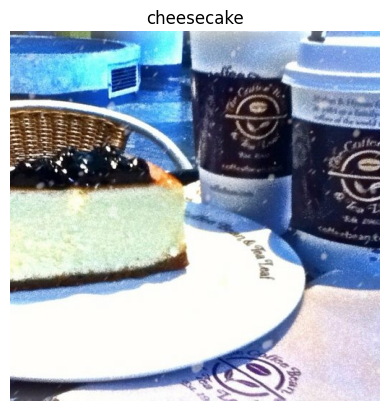

In [5]:
# Output info about one training sample
for image, label in train_data.take(1):
  print(f"""
  Image shape: {image.shape}
  Image datatype: {image.dtype}
  Target class from Food101 (tensor form): {label}
  Class name (str form): {class_names[label.numpy()]}
  """)
  # Plot the image tensor
  plt.imshow(image)
  plt.title(class_names[label.numpy()]) # Add title to image to verify the label is associated with the right image
  plt.axis(False);

### Create preprocessing function for data

In [6]:
# Make a function for preprocessing images
def preprocess_img(image, label, img_shape=224):
  """
  Converts image datatype from 'uint8' -> 'float32' and reshapes
  image to [img_shape, img_shape, color_channels]
  """
  image = tf.image.resize(image, [img_shape, img_shape]) # reshape target image
  return tf.cast(image, tf.float32), label # return (float32_image, label) tuple

### Batch & prepare datasets for modeling

In [7]:
# Map preprocessing function to training data (and parallelize it)
train_data = train_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle train_data, turn it into batches, and prefetch it (load it faster)
train_data = train_data.shuffle(buffer_size=1000).batch(batch_size=32).prefetch(buffer_size=tf.data.AUTOTUNE)

# Map preprocessing function to test data
test_data = test_data.map(map_func=preprocess_img, num_parallel_calls=tf.data.AUTOTUNE).batch(32).prefetch(tf.data.AUTOTUNE)

### Create modeling callbacks

In [8]:
# Create ModelCheckpoint callback to save a model's progress during training
checkpoint_path = "model_checkpoints/cp.ckpt"
model_checkpoint = tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                                      monitor="val_acc",
                                                      save_best_only=True,
                                                      save_weights_only=True,
                                                      verbose=0) # Don't print whether or not model is being saved

### Set up mixed precision training and build a feature extraction model

In [9]:
from tensorflow.keras import mixed_precision, layers

# Set global data policy to mixed precision
mixed_precision.set_global_policy("mixed_float16")

# Create base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.EfficientNetV2B0(include_top=False)
base_model.trainable = False

# Create functional model
inputs = layers.Input(shape=input_shape, name="input_layer")
x = base_model(inputs, training=False) # make sure layers which should be in inference mode only stay like that
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_float32")(x)
effnetb0 = tf.keras.Model(inputs, outputs)

# Compile the model
effnetb0.compile(loss="sparse_categorical_crossentropy",
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=["accuracy"])

24274472/24274472 [==============================] - 2s 0us/step


In [10]:
effnetb0.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_layer (InputLayer)    [(None, 224, 224, 3)]     0         
                                                                 
 efficientnetv2-b0 (Functio  (None, None, None, 1280   5919312   
 nal)                        )                                   
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 101)               129381    
                                                                 
 softmax_float32 (Activatio  (None, 101)               0         
 n)                                                              
                                                             

In [11]:
# Fit the feature extraction model with callbacks
effnetb0_feature_extraction_history = effnetb0.fit(train_data,
                                                   epochs=3,
                                                   steps_per_epoch=len(train_data),
                                                   validation_data=test_data,
                                                   validation_steps=int(0.15*len(test_data)),
                                                   callbacks=[create_tensorboard_callback(dir_name="training_logs",
                                                                                          experiment_name="effnetb0_feature_extraction"),
                                                              model_checkpoint])

Saving TensorBoard log files to: training_logs/effnetb0_feature_extraction/20240731-150145
Epoch 1/3
2368/2368 [==============================] - ETA: 0s - loss: 1.7441 - accuracy: 0.5783

2368/2368 [==============================] - 61s 21ms/step - loss: 1.7441 - accuracy: 0.5783 - val_loss: 1.1415 - val_accuracy: 0.7018
Epoch 2/3
2366/2368 [============================>.] - ETA: 0s - loss: 1.2125 - accuracy: 0.6864

2368/2368 [==============================] - 49s 20ms/step - loss: 1.2126 - accuracy: 0.6864 - val_loss: 1.0403 - val_accuracy: 0.7262
Epoch 3/3
2368/2368 [==============================] - ETA: 0s - loss: 1.0636 - accuracy: 0.7223

2368/2368 [==============================] - 49s 20ms/step - loss: 1.0636 - accuracy: 0.7223 - val_loss: 0.9903 - val_accuracy: 0.7365


In [12]:
# Evaluate model on whole test dataset
effnetb0_results = effnetb0.evaluate(test_data)

790/790 [==============================] - 12s 16ms/step - loss: 0.9908 - accuracy: 0.7321


### Save the whole model to file

In [13]:
# Save model locally
effnetb0.save("effnetb0")

In [14]:
# Load model previously saved above
loaded_model = tf.keras.models.load_model("effnetb0")

In [15]:
# Check the layers in the base model and see what dtype policy they're using
for layer in loaded_model.layers[1].layers:
  print(layer.name, layer.trainable, layer.dtype, layer.dtype_policy)

input_1 True float32 <Policy "float32">
rescaling False float32 <Policy "mixed_float16">
normalization False float32 <Policy "mixed_float16">
stem_conv False float32 <Policy "mixed_float16">
stem_bn False float32 <Policy "mixed_float16">
stem_activation False float32 <Policy "mixed_float16">
block1a_project_conv False float32 <Policy "mixed_float16">
block1a_project_bn False float32 <Policy "mixed_float16">
block1a_project_activation False float32 <Policy "mixed_float16">
block2a_expand_conv False float32 <Policy "mixed_float16">
block2a_expand_bn False float32 <Policy "mixed_float16">
block2a_expand_activation False float32 <Policy "mixed_float16">
block2a_project_conv False float32 <Policy "mixed_float16">
block2a_project_bn False float32 <Policy "mixed_float16">
block2b_expand_conv False float32 <Policy "mixed_float16">
block2b_expand_bn False float32 <Policy "mixed_float16">
block2b_expand_activation False float32 <Policy "mixed_float16">
block2b_project_conv False float32 <Policy 

In [16]:
# Check loaded model performance (this should be the same as model_1_results)
loaded_model_results = loaded_model.evaluate(test_data)

790/790 [==============================] - 16s 17ms/step - loss: 0.9908 - accuracy: 0.7321


**Why am I saving the whole model if I already saved the weights with the ModelCheckpoint callback?**

### Prepare the model's layers for fine-tuning

In [17]:
# Set all of the layer.trainable variables in the loaded model to True (so they're unfrozen)
loaded_model.layers[1].trainable = True

In [18]:
# Set up EarlyStopping callback to stop training if model's val_loss doesn't improve for 3 epochs
# Monitor the val_loss and stop training if it doesn't improve for 3 epochs
# See: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping for more
early_stop = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
                                              patience=3,
                                              restore_best_weights=True)

# Create ModelCheckpoint callback to save best model during fine-tuning
# Save the best model only
# Monitor val_loss while training and save the best model (lowest val_loss)
# See: https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint for more
checkpoint_path_2 = "model_checkpoints/cp_2.ckpt"
model_checkpoint_2 = tf.keras.callbacks.ModelCheckpoint(checkpoint_path_2,
                                                        monitor="val_loss",
                                                        save_best_only=True,
                                                        save_weights_only=True,
                                                        verbose=0) # Don't print whether or not model is being saved)

In [19]:
# Compile the model ready for fine-tuning
# Use the Adam optimizer with a 10x lower than default learning rate
loaded_model.compile(loss="sparse_categorical_crossentropy",
                     optimizer=tf.keras.optimizers.Adam(lr=0.0001),
                     metrics=["accuracy"])

In [20]:
# Start to fine-tune (all layers)
# Use 100 epochs as the default
# Validate on 15% of the test data
# Use the create_tensorboard_callback, ModelCheckpoint, and EarlyStopping callbacks you created earlier
effnetb0_fine_tune_history = loaded_model.fit(train_data,
                                              epochs=100,
                                              validation_data=test_data,
                                              validation_steps=int(0.15*len(test_data)),
                                              initial_epoch=effnetb0_feature_extraction_history.epoch[-1],
                                              callbacks=[create_tensorboard_callback(dir_name="training_logs",
                                                                                     experiment_name="effnetb0_fine_tuning"),
                                                         model_checkpoint_2,
                                                         early_stop])

Saving TensorBoard log files to: training_logs/effnetb0_fine_tuning/20240731-150533
Epoch 3/100
2368/2368 [==============================] - 203s 67ms/step - loss: 1.5655 - accuracy: 0.5984 - val_loss: 1.0195 - val_accuracy: 0.7214
Epoch 4/100
2368/2368 [==============================] - 156s 66ms/step - loss: 1.0918 - accuracy: 0.7057 - val_loss: 0.9202 - val_accuracy: 0.7431
Epoch 5/100
2368/2368 [==============================] - 155s 65ms/step - loss: 0.9028 - accuracy: 0.7510 - val_loss: 1.0787 - val_accuracy: 0.7092
Epoch 6/100
2368/2368 [==============================] - 155s 65ms/step - loss: 0.7962 - accuracy: 0.7789 - val_loss: 0.9294 - val_accuracy: 0.7431
Epoch 7/100
2368/2368 [==============================] - 155s 65ms/step - loss: 0.6828 - accuracy: 0.8068 - val_loss: 0.9782 - val_accuracy: 0.7468


In [21]:
# Save model locally
loaded_model.save("loaded_model")

In [22]:
# Evaluate mixed precision trained fine-tuned model (this should beat DeepFood's 77.4% top-1 accuracy)
effnetb0_fine_tune_results = loaded_model.evaluate(test_data)

790/790 [==============================] - 13s 16ms/step - loss: 0.9214 - accuracy: 0.7426


### View training results on TensorBoard

In [23]:
%load_ext tensorboard
%tensorboard --logdir training_logs

<IPython.core.display.Javascript object>

Fine-tuning seems to have made the model perform only slightly better compared to purely using feature extraction. With feature extraction the model was able to achieve a ~73.21% accuracy on the test data, and with fine-tuning it achieved an accuracy of 74.26%. The model was unable to beat the DeepFood paper's accuracy of 77.4%, and I am not sure what else I could try to do to improve the model's results, as I believe that I did everything I was supposed to do...

## 2. Use the same evaluation techniques on this FoodVision model as you did in the previous notebook. More specifically, it would be good to see:
* A confusion matrix between all of the model's predictions and true labels.
* A graph showing the f1-scores of each class.
* A visualization of the model making predictions on various images and comparing the predictions to the ground truth.
  * For example, plot a sample image from the test dataset and have the title of the plot show the prediction, the prediction probability, and the ground truth label.
* **Note:** To compare predicted labels to test labels, it might be a good idea when loading the test data to set `shuffle=False` (so the ordering of the test data is preserved alongside the order of predicted labels).

### Confusion Matrix

In [24]:
import itertools
from sklearn.metrics import confusion_matrix

# We need to make some changes to our make_confusion_matrix function to ensure the x_labels print vertically
def make_confusion_matrix(y_true, y_pred, classes=None, figsize=(10, 10), text_size=15, norm=False, savefig=False):
  """Makes a labelled confusion matrix comparing predictions and ground truth labels.

  If classes is passed, confusion matrix will be labelled, if not, integer class values
  will be used.

  Args:
    y_true: Array of truth labels (must be same shape as y_pred).
    y_pred: Array of predicted labels (must be same shape as y_true).
    classes: Array of class labels (e.g. string form). If `None`, integer labels are used.
    figsize: Size of output figure (default=(10, 10)).
    text_size: Size of output figure text (default=15).
    norm: normalize values or not (default=False).
    savefig: save confusion matrix to file (default=False).

  Returns:
    A labelled confusion matrix plot comparing y_true and y_pred.

  Example usage:
    make_confusion_matrix(y_true=test_labels, # ground truth test labels
                          y_pred=y_preds, # predicted labels
                          classes=class_names, # array of class label names
                          figsize=(15, 15),
                          text_size=10)
  """
  # Create the confustion matrix
  cm = confusion_matrix(y_true, y_pred)
  cm_norm = cm.astype("float") / cm.sum(axis=1)[:, np.newaxis] # normalize it
  n_classes = cm.shape[0] # find the number of classes we're dealing with

  # Plot the figure and make it pretty
  fig, ax = plt.subplots(figsize=figsize)
  cax = ax.matshow(cm, cmap=plt.cm.Blues) # colors will represent how 'correct' a class is, darker == better
  fig.colorbar(cax)

  # Are there a list of classes?
  if classes:
    labels = classes
  else:
    labels = np.arange(cm.shape[0])

  # Label the axes
  ax.set(title="Confusion Matrix",
         xlabel="Predicted label",
         ylabel="True label",
         xticks=np.arange(n_classes), # create enough axis slots for each class
         yticks=np.arange(n_classes),
         xticklabels=labels, # axes will labeled with class names (if they exist) or ints
         yticklabels=labels)

  # Make x-axis labels appear on bottom
  ax.xaxis.set_label_position("bottom")
  ax.xaxis.tick_bottom()

  ### Changed: (plot x-labels vertically) ###
  plt.xticks(rotation=70, fontsize=text_size)
  plt.yticks(fontsize=text_size)

  # Set the threshold for different colors
  threshold = (cm.max() + cm.min()) / 2.

  # Plot the text on each cell
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    if norm:
      plt.text(j, i, f"{cm[i, j]} ({cm_norm[i, j]*100:.1f}%)",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)
    else:
      plt.text(j, i, f"{cm[i, j]}",
              horizontalalignment="center",
              color="white" if cm[i, j] > threshold else "black",
              size=text_size)

  # Save the figure to the current working directory
  if savefig:
    fig.savefig("confusion_matrix.png")

In [25]:
pred_probs = loaded_model.predict(test_data, verbose=1)
pred_classes = pred_probs.argmax(axis=1)
y_labels = []
for images, labels in test_data.unbatch():
  y_labels.append(labels.numpy())

make_confusion_matrix(y_true=y_labels,
                      y_pred=pred_classes,
                      classes=class_names,
                      figsize=(100, 100),
                      text_size=20,
                      savefig=True)

790/790 [==============================] - 15s 17ms/step


### F1-scores graph

In [26]:
from sklearn.metrics import classification_report

# Get a dictionary of the classification report
classification_report_dict = classification_report(y_labels, pred_classes, output_dict=True)

# Create empty dictionary
class_f1_scores = {}

# Loop through classification report dictionary items
for k, v in classification_report_dict.items():
  if k == "accuracy": # stop once we get to accuracy key
    break
  else:
    # Add class names and f1-scores to new dictionary
    class_f1_scores[class_names[int(k)]] = v["f1-score"]

In [27]:
# Turn f1-scores into dataframes for visualization

f1_scores = pd.DataFrame({"class_names":list(class_f1_scores.keys()),
                          "f1-score": list(class_f1_scores.values())}).sort_values("f1-score", ascending=False)

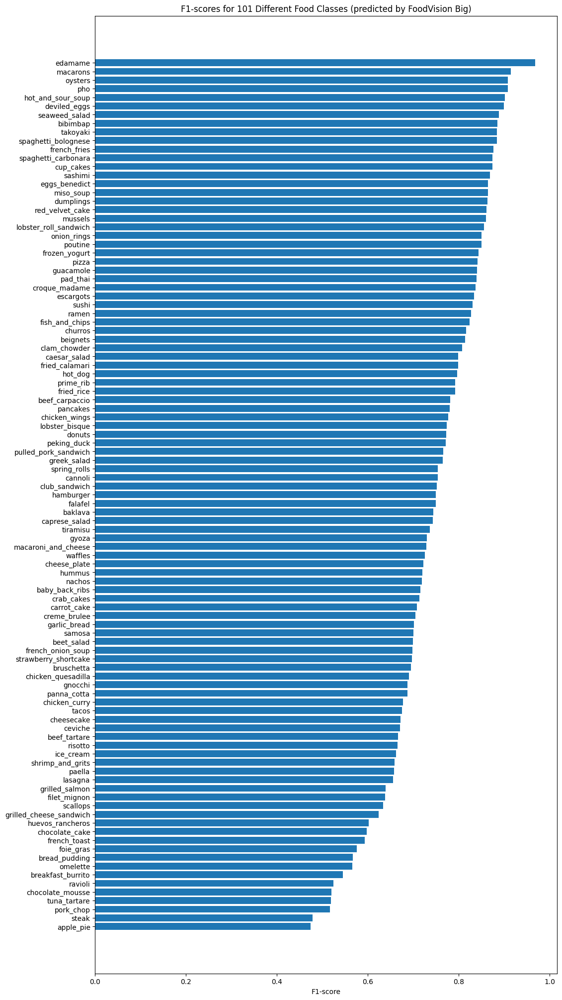

In [28]:
fig, ax = plt.subplots(figsize=(12, 25))
scores = ax.barh(range(len(f1_scores)), f1_scores["f1-score"].values) # get f1-scores values
ax.set_yticks(range(len(f1_scores)))
ax.set_yticklabels(f1_scores["class_names"])
ax.set_xlabel("F1-score")
ax.set_title("F1-scores for 101 Different Food Classes (predicted by FoodVision Big)")
ax.invert_yaxis(); # reverse the order of our plot

### Predictions Visualization

1/1 [==============================] - 0s 28ms/step


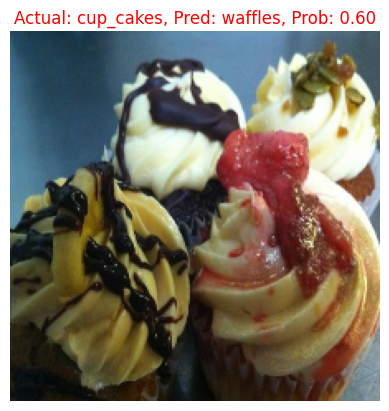

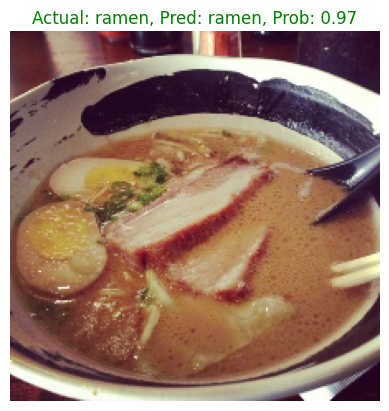

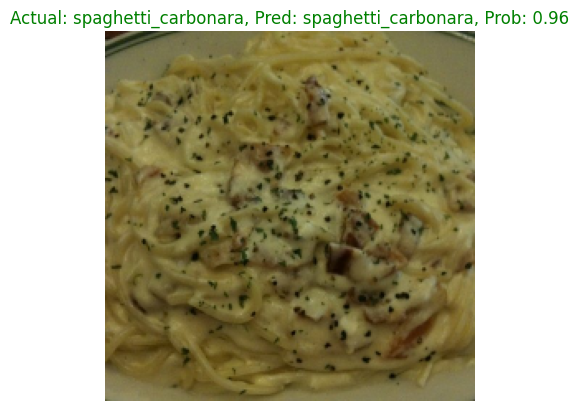

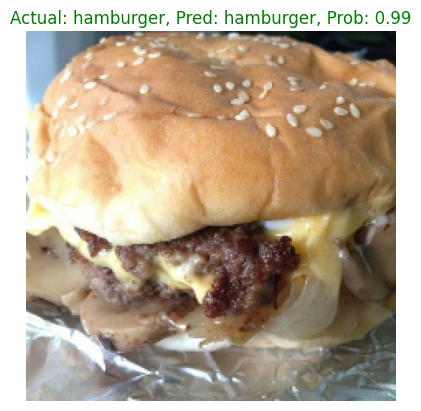

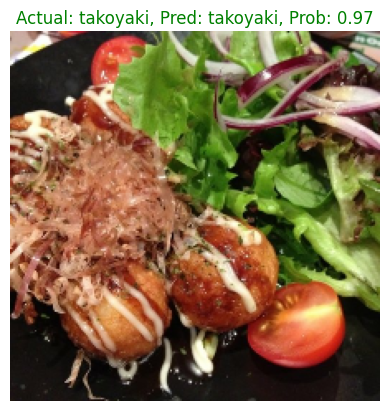

In [29]:
# Visualize 5 predictions on test data
for image, label in test_data.unbatch().take(5):
  class_name = class_names[label.numpy()]
  pred_prob = loaded_model.predict(tf.expand_dims(image, axis=0), batch_size=1)
  pred_class = class_names[pred_prob.argmax()]

  if class_name == pred_class: # if predicted class matches truth class, make text green
    title_color = "g"
  else:
    title_color = "r"

  # Plot the image tensor
  plt.figure()
  plt.imshow(image/255)
  plt.title(f"Actual: {class_name}, Pred: {pred_class}, Prob: {pred_prob.max():.2f}", c=title_color)
  plt.axis(False);

## 3. Take 3 of your own photos of food and use the FoodVision model to make predictions on them. How does it go?

I will be using the 6 images saved in the TensorFlow course GitHub.

In [30]:
# Getting 6 custom images from GitHub
!wget https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip

unzip_data("custom_food_images.zip")
!rm custom_food_images.zip

--2024-07-31 15:21:20--  https://storage.googleapis.com/ztm_tf_course/food_vision/custom_food_images.zip
Resolving storage.googleapis.com (storage.googleapis.com)... 172.253.118.207, 74.125.200.207, 74.125.130.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|172.253.118.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13192985 (13M) [application/zip]
Saving to: ‘custom_food_images.zip’

custom_food_images. 100%[===================>]  12.58M  6.45MB/s    in 2.0s    

2024-07-31 15:21:23 (6.45 MB/s) - ‘custom_food_images.zip’ saved [13192985/13192985]



1/1 [==============================] - 0s 32ms/step


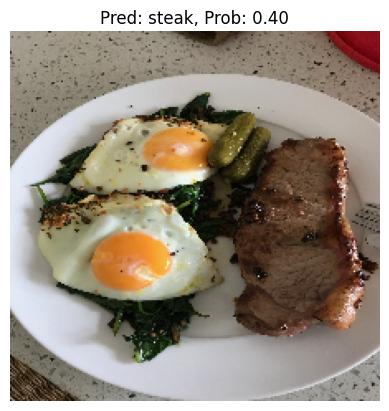

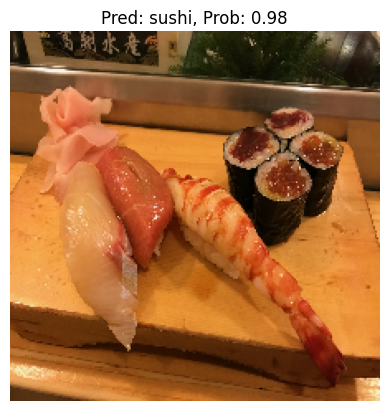

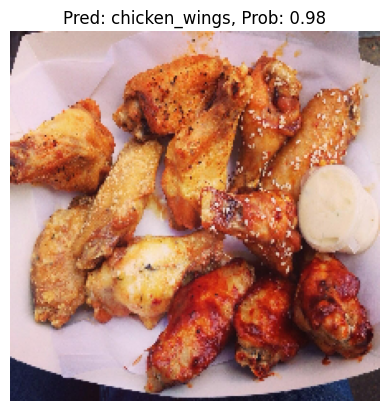

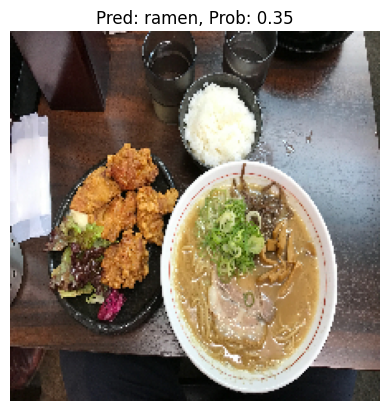

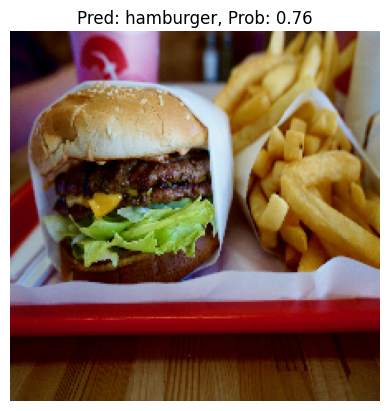

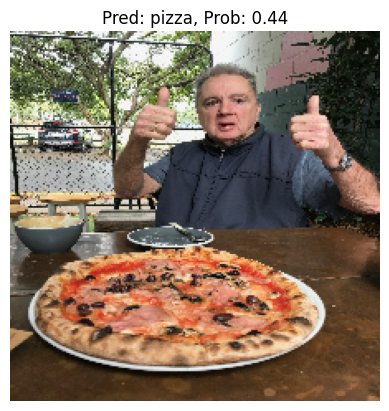

In [31]:
import os

custom_image_paths = ["custom_food_images/" + img_path for img_path in os.listdir("custom_food_images")]

for image_path in custom_image_paths:
  img = load_and_prep_image(image_path, scale=False)
  pred_prob = loaded_model.predict(tf.expand_dims(img, axis=0))
  pred_class = class_names[pred_prob.argmax()]
  plt.figure()
  plt.imshow(img/255.)
  plt.title(f"Pred: {pred_class}, Prob: {pred_prob.max():.2f}")
  plt.axis(False)

## 4. Retrain the model (feature extraction and fine-tuning), except this time use `EfficientNetB4` as the base model instead of `EfficientNetB0`. Do you notice an improvement in performance? Does it take longer to train? Are there any tradeoffs to consider?

In [32]:
# Create new base model
input_shape = (224, 224, 3)
base_model = tf.keras.applications.EfficientNetB4(include_top=False)
base_model.trainable = False

# Create functional model
inputs = layers.Input(shape=input_shape, name="input_layer")
x = base_model(inputs, training=False) # make sure layers which should be in inference mode only stay like that
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(len(class_names))(x)
outputs = layers.Activation("softmax", dtype=tf.float32, name="softmax_float32")(x)
effnetb4 = tf.keras.Model(inputs, outputs)

# Compile the model
effnetb4.compile(loss="sparse_categorical_crossentropy",
                 optimizer=tf.keras.optimizers.Adam(),
                 metrics=["accuracy"])

71686520/71686520 [==============================] - 4s 0us/step


In [33]:
checkpoint_path_3 = "model_checkpoints/cp_3.ckpt"
model_checkpoint_3 = tf.keras.callbacks.ModelCheckpoint(checkpoint_path_3,
                                                        monitor="val_loss",
                                                        save_best_only=True,
                                                        save_weights_only=True,
                                                        verbose=0) # Don't print whether or not model is being saved)

In [34]:
# Fit the feature extraction model with callbacks
effnetb4_feature_extraction_history = effnetb4.fit(train_data,
                                                   epochs=3,
                                                   steps_per_epoch=len(train_data),
                                                   validation_data=test_data,
                                                   validation_steps=int(0.15*len(test_data)),
                                                   callbacks=[create_tensorboard_callback(dir_name="training_logs",
                                                                                          experiment_name="effnetb4_feature_extraction"),
                                                              model_checkpoint_3])

Saving TensorBoard log files to: training_logs/effnetb4_feature_extraction/20240731-152139
Epoch 1/3
2368/2368 [==============================] - 145s 55ms/step - loss: 1.7908 - accuracy: 0.5575 - val_loss: 1.2569 - val_accuracy: 0.6729
Epoch 2/3
2368/2368 [==============================] - 128s 54ms/step - loss: 1.3087 - accuracy: 0.6577 - val_loss: 1.1525 - val_accuracy: 0.6891
Epoch 3/3
2368/2368 [==============================] - 127s 54ms/step - loss: 1.1626 - accuracy: 0.6945 - val_loss: 1.1300 - val_accuracy: 0.7005


In [35]:
effnetb4_results = effnetb4.evaluate(test_data)

790/790 [==============================] - 36s 46ms/step - loss: 1.1252 - accuracy: 0.6961


In [36]:
base_model.trainable = True

effnetb4.compile(loss="sparse_categorical_crossentropy",
                 optimizer=tf.keras.optimizers.Adam(lr=0.0001),
                 metrics=["accuracy"])

In [37]:
# Fit the feature extraction model with callbacks
effnetb4_fine_tune_history = effnetb4.fit(train_data,
                                          epochs=100,
                                          steps_per_epoch=len(train_data),
                                          validation_data=test_data,
                                          validation_steps=int(0.15*len(test_data)),
                                          initial_epoch=effnetb4_feature_extraction_history.epoch[-1],
                                          callbacks=[create_tensorboard_callback(dir_name="training_logs",
                                                                                 experiment_name="effnetb4_fine_tuning"),
                                                     early_stop])

Saving TensorBoard log files to: training_logs/effnetb4_fine_tuning/20240731-152856
Epoch 3/100
2368/2368 [==============================] - 567s 202ms/step - loss: 1.7534 - accuracy: 0.5538 - val_loss: 1.3291 - val_accuracy: 0.6676
Epoch 4/100
2368/2368 [==============================] - 477s 201ms/step - loss: 1.3788 - accuracy: 0.6376 - val_loss: 1.2341 - val_accuracy: 0.6706
Epoch 5/100
2368/2368 [==============================] - 476s 201ms/step - loss: 1.2401 - accuracy: 0.6722 - val_loss: 1.2826 - val_accuracy: 0.6600
Epoch 6/100
2368/2368 [==============================] - 476s 201ms/step - loss: 1.1983 - accuracy: 0.6793 - val_loss: 1.1025 - val_accuracy: 0.7005
Epoch 7/100
2368/2368 [==============================] - 475s 201ms/step - loss: 1.1859 - accuracy: 0.6830 - val_loss: 1.1455 - val_accuracy: 0.6867
Epoch 8/100
2368/2368 [==============================] - 446s 188ms/step - loss: nan - accuracy: 0.4973 - val_loss: nan - val_accuracy: 0.0072
Epoch 9/100
2368/2368 [=====

In [38]:
effnetb4_fine_tune_results = effnetb4.evaluate(test_data)

790/790 [==============================] - 36s 45ms/step - loss: 1.1068 - accuracy: 0.7048


The EffNetB4 model took considerably longer to train than the EffNetB0 model, and did not perform nearly as well. It achieved a ~69.61% test accuracy before fine-tuning, and after fine-tuning the model achieved a max test accuracy of ~70.48% before the loss exploded and the accuracy fell dismally, even with a small learning rate.

## 5. Name one important benefit of mixed precision training. How does this benefit take place?

Mixed precision is the use of both `float16` and `float32` dtypes in a model during training to make it run faster and use less memory. By keeping certain parts of the model in `float32` for numeric stability and changing other parts to `float16` for computational efficiency, the model will have a lower step time and train equally as well in terms of the evaluation metrics such as accuracy.